<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
%matplotlib inline
import pandas as pd
from typing import Tuple
import pickle
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score as r2, mean_squared_error as MSE
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from phik import resources, report
from phik.report import plot_correlation_matrix
from typing import List, Union

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Чтобы зафиксировать случайность и воспроизводить один и тот же результат при повторных запусках ноутбука`

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [2]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


In [3]:
# Сохранение файлов для будущего тестирования FastAPI
#df_test.sample(1, random_state=42).to_json('one_item.json', orient='records')
#df_test.sample(3, random_state=42).to_json('three_items.json', orient='records')
#df_test.sample(5, random_state=42).to_csv('test.csv', index=False)

### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [4]:
# your code here
display(df_train.sample(10))
display(df_test.head(5))
display(df_test.tail(5))
pd.concat([df_train, df_test]).duplicated().sum()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


1170

In [5]:
display(df_train.isna().sum())
df_test.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          202
engine           202
max_power        196
torque           203
seats            202
dtype: int64

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage          19
engine           19
max_power        19
torque           19
seats            19
dtype: int64

In [6]:
display(df_train.duplicated().sum())
display(df_test.duplicated().sum())

985

62

In [7]:
profile = ProfileReport(pd.concat([df_train, df_test]), title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
profile

In [9]:
# Сохранение отчёта в HTML
#profile.to_file("report.html")

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете по *тренировочному* набору данных и им же заполняете *тестовый*.

In [10]:
# Цикл для преобразования колонок к нужному типу float
# Выделения единиц измерения и заполнения пропусков медианами на основе данных train
for i in ['mileage', 'engine', 'max_power']:
    for d in [df_train, df_test]:
        d[[i, i+'_units']] = d[i].str.split(' ', expand=True)
        d['max_power'] = d['max_power'].replace('', np.nan)
        d[i] = d[i].astype('float')
        med_val = df_train[i].median()
        d[i] = d[i].fillna(med_val)

In [11]:
# Смотрим какие есть уникальные единицы измерения в train
for i in ['max_power_units', 'engine_units', 'mileage_units']:
    display(df_train[i].unique())

array(['bhp', nan, None], dtype=object)

array(['CC', nan], dtype=object)

array(['kmpl', 'km/kg', nan], dtype=object)

In [12]:
# Приведение mileage к единым единицам измерения (kmlp)
for d in [df_train, df_test]:
    d.loc[d['mileage_units']=='km/kg', 'mileage'] = d['mileage'] * 0.75
    seats_mode = df_train['seats'].mode()[0]
    d['seats'] = d['seats'].fillna(seats_mode)
    d.drop(columns=['max_power_units', 'engine_units', 'mileage_units'], inplace=True)

In [13]:
df_train.isna().sum()

name               0
year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage            0
engine             0
max_power          0
torque           203
seats              0
dtype: int64

In [14]:
df_test.isna().sum()

name              0
year              0
selling_price     0
km_driven         0
fuel              0
seller_type       0
transmission      0
owner             0
mileage           0
engine            0
max_power         0
torque           19
seats             0
dtype: int64

`Пропуски остались только в столбце torque (далее его удалим)`

### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ] Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [15]:
df_train.drop(columns='selling_price').duplicated().sum()

1159

In [16]:
df_train[df_train.drop(columns='selling_price').duplicated()]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.90,1197.0,82.00,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,85.80,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.10,1197.0,85.80,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.60,1999.0,177.00,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37,2487.0,214.56,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.00,995.0,62.00,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.40,1498.0,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59,1248.0,74.00,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57,1396.0,70.00,140Nm@ 1800-3000rpm,5.0


Мы видим 1159 объектов с одинаковыми признаками, они являются одинаковыми автомобилями

In [17]:
# Уберём дубликаты в обучающей выборке и починим индексы
df_train = df_train.drop_duplicates(subset = df_train.drop(columns='selling_price').columns, keep='first')
df_train = df_train.reset_index(drop=True)

In [18]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [19]:
# Удаление столбца torque из test и train
# Остальная предобработка данных проведена выше
for d in [df_train, df_test]:
    d.drop(columns='torque', inplace=True)

### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [20]:
# Приведение к типу int64
for d in [df_train, df_test]:
    for c in ['engine', 'seats']:
        df_train[c] = df_train[c].astype('int64')

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [21]:
# Вывод статистик для train и test
for d in [df_train, df_test]:
    display(d.describe(include='all'))

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
count,5840,5840.000000,5.840000e+03,5.840000e+03,5840,5840,5840,5840,5840.000000,5840.000000,5840.000000,5840.000000
unique,1924,NaN,NaN,NaN,4,3,2,5,NaN,NaN,NaN,NaN
top,Maruti Swift Dzire VDI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,NaN,NaN,NaN,NaN
freq,91,NaN,NaN,NaN,3177,5223,5336,3603,NaN,NaN,NaN,NaN
mean,NaN,2013.428425,5.229601e+05,7.395224e+04,NaN,NaN,NaN,NaN,19.356524,1429.448973,87.910782,5.426712
std,NaN,4.095622,5.354320e+05,6.007114e+04,NaN,NaN,NaN,NaN,3.965907,485.662834,31.639585,0.982344
min,NaN,1983.000000,2.999900e+04,1.000000e+00,NaN,NaN,NaN,NaN,0.000000,624.000000,0.000000,2.000000
25%,NaN,2011.000000,2.500000e+05,3.900000e+04,NaN,NaN,NaN,NaN,16.800000,1197.000000,68.000000,5.000000
50%,NaN,2014.000000,4.050000e+05,7.000000e+04,NaN,NaN,NaN,NaN,19.300000,1248.000000,81.860000,5.000000
75%,NaN,2017.000000,6.400000e+05,1.000000e+05,NaN,NaN,NaN,NaN,22.070000,1498.000000,99.000000,5.000000


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
count,1000,1000.000000,1.000000e+03,1000.000000,1000,1000,1000,1000,1000.000000,1000.00000,1000.000000,1000.000000
unique,621,NaN,NaN,NaN,4,3,2,5,NaN,NaN,NaN,NaN
top,Maruti Alto 800 LXI,NaN,NaN,NaN,Diesel,Individual,Manual,First Owner,NaN,NaN,NaN,NaN
freq,15,NaN,NaN,NaN,534,837,877,623,NaN,NaN,NaN,NaN
mean,NaN,2013.681000,6.179010e+05,71393.341000,NaN,NaN,NaN,NaN,19.290732,1454.87600,90.844330,5.403000
std,NaN,4.012149,7.585539e+05,48486.218662,NaN,NaN,NaN,NaN,3.948880,521.99574,34.892709,0.912921
min,NaN,1995.000000,3.100000e+04,1303.000000,NaN,NaN,NaN,NaN,0.000000,624.00000,34.200000,4.000000
25%,NaN,2011.000000,2.500000e+05,37000.000000,NaN,NaN,NaN,NaN,16.500000,1197.00000,69.000000,5.000000
50%,NaN,2014.000000,4.349990e+05,61500.000000,NaN,NaN,NaN,NaN,19.300000,1248.00000,82.425000,5.000000
75%,NaN,2017.000000,6.700000e+05,100000.000000,NaN,NaN,NaN,NaN,22.300000,1582.00000,102.000000,5.000000


In [22]:
# Здесь может быть только 12 столбцов (после удаления torque)
#assert df_train.shape == (5840, 13)
assert df_train.shape == (5840, 12)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

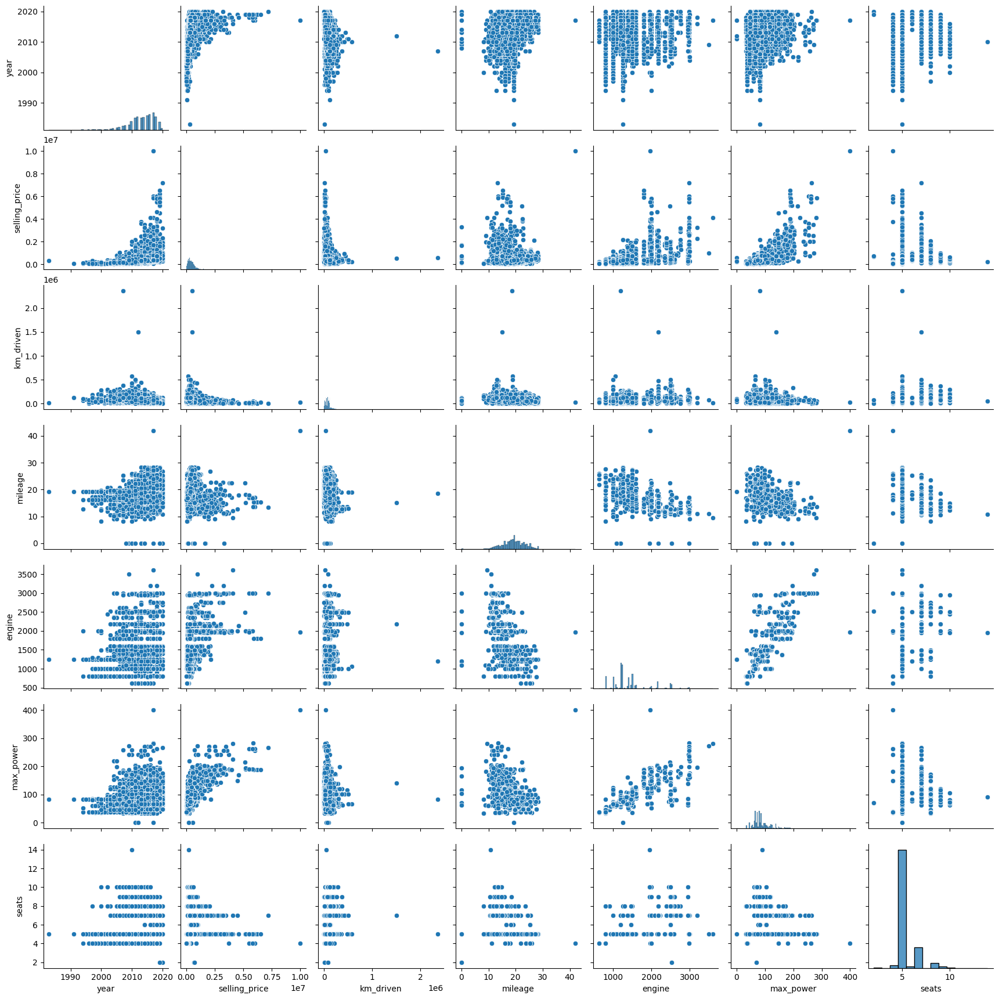

In [23]:
# Распределение числовых признаков для train
sns.pairplot(df_train)
plt.show()

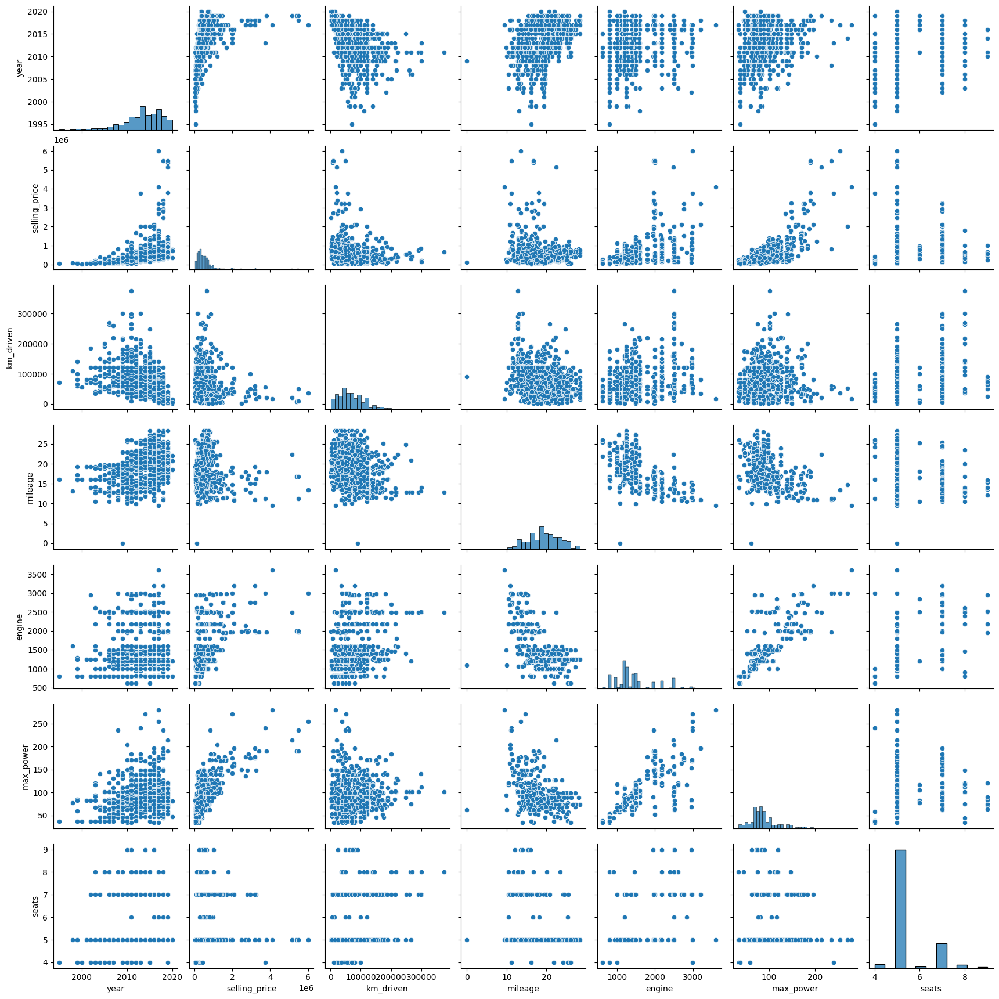

In [24]:
# Распределение числовых признаков для test
sns.pairplot(df_test)
plt.show()

`Выводы - распределение в train`
* Связь между годом выпуска и ценой продажи: Графики показывают, что с увеличением года выпуска автомобилей наблюдается тенденция к увеличению цены продажи. Это указывает на то, что более новые автомобили стоят дороже

* Связь между пробегом и ценой продажи: Чем больше пробег автомобиля, тем, как правило, ниже его цена. Это объясняется тем, что автомобили с большим пробегом могут быть менее привлекательны для покупателей

* Мощность двигателя и максимальная мощность: Существует корреляция между мощностью двигателя и максимальной мощностью. Более мощные двигатели обеспечивают большую максимальную мощность

* Связь между мощностью и ценой: Автомобили с более высокой максимальной мощностью имеют тенденцию стоить дороже. Это может быть связано с тем, что более мощные автомобили часто являются более престижными и имеют более высокую стоимость

* Число сидений: Большинство автомобилей на графике имеют 5 сидений. Это типичный размер для легковых автомобилей

`Выводы - распределения в train и test`
* Сравнение распределения года выпуска: В обеих выборках прослеживается аналогичная тенденция: большинство автомобилей сосредоточено в диапазоне более новых моделей (последние 10-20 лет). Это говорит о сходстве в распределении года выпуска между train и test выборками

* Цена продажи (selling_price): Распределение цены продажи имеет схожий характер в обеих выборках: большинство значений сосредоточено на более низких значениях цены, с некоторыми выбросами на высоких ценах. Различия между train и test в этой метрике минимальны

* Пройденное расстояние (km_driven): Распределение пройденного расстояния также схоже между train и test выборками: наблюдается тенденция к увеличению количества автомобилей с относительно меньшим пробегом

* Связь между характеристиками автомобиля (мощность двигателя, мощность, пробег): Взаимосвязь между техническими характеристиками (такими как мощность, объем двигателя и пробег) схожа в обеих выборках. На графиках нет значительных отличий в характере распределений и их взаимосвязи

* Число мест: Оба графика показывают, что большинство автомобилей имеют 5 мест, что указывает на схожее распределение этой характеристики в обеих выборках

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


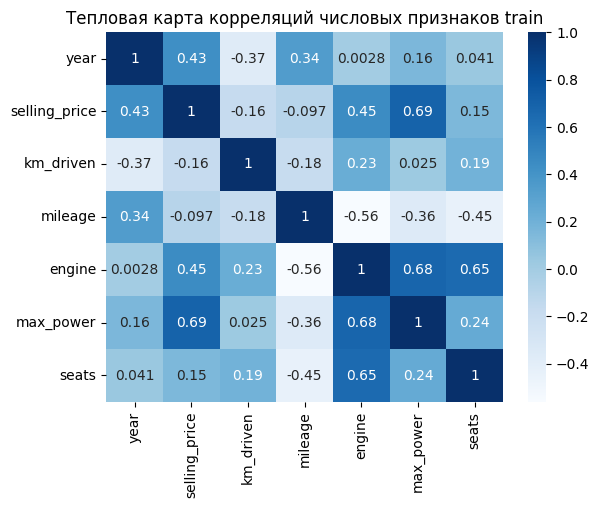

In [25]:
# Тепловая карта корреляций числовых признаков train
corr = df_train.select_dtypes(include=np.number).corr()
sns.heatmap(data=corr, cmap='Blues', annot=True)
plt.title('Тепловая карта корреляций числовых признаков train')
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Выводы`
* Наименее скорелированы  между собой (0.0028) год выпуска (year) и мощность двигателя (enginge)
* Наиболее сильная положительная корреляция наблюдается между максимальной мощностью (max_power) и мощностью двигателя engine (0.68). Это показывает, что автомобили с более мощными двигателями, как правило, имеют более высокую максимальную мощность
* На основе тепловой карты видно, что чем меньше год выпуска, тем больше километров проехала машина к дате продажи. Это подтверждается отрицательной корреляцией между year и km_driven (-0.37)

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

In [26]:
# Посмтроим матрицу корреляций для всех типов признаков через phik
phik_matrix = df_train.drop(columns='name').phik_matrix(interval_cols = ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'seats'])

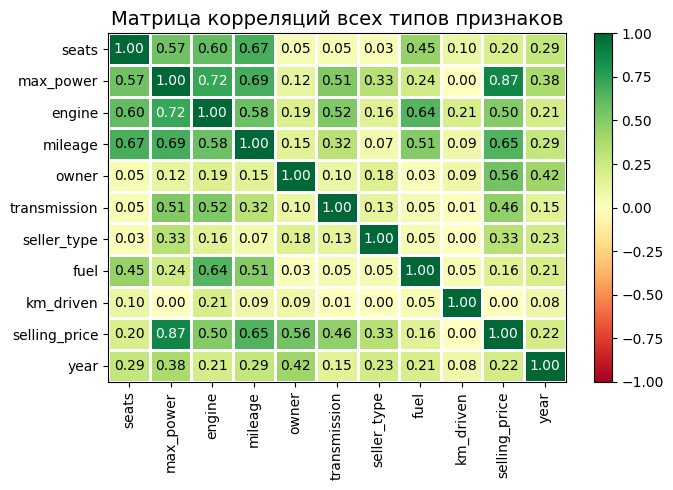

In [27]:
plot_correlation_matrix(phik_matrix.values, x_labels=phik_matrix.columns, y_labels=phik_matrix.index,
                        vmin=-1, vmax=1, title="Матрица корреляций всех типов признаков")
plt.show()

`Выводы`
* Если построить матрицу корреляций по всем признакам, то можно заметить, что между целевой переменной (selling_price) и категориальными признаками (owner, transmission и seller_type) наблюдается умеренная корреляция (0.56, 0.46 и 0.33 соответственно) 
* При это заметно различие в значениях корреляций между числовыми признаками (по сравнению с тем, что было в дефолтной корреляции), это объясняется другой формулой расчёта, заложенной в phik

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [28]:
# Разбивка данных на обучающую, валидационную и тестовую выборки
X, y = df_train.select_dtypes(include=np.number).drop(columns='selling_price').copy(), df_train['selling_price'].copy()
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25)
X_test, y_test = df_test.select_dtypes(include=np.number).drop(columns='selling_price').copy(), df_test['selling_price'].copy()

In [29]:
# Мы разбиваем исходную train выборку на train и val, поэтому исходный assert здесь не сработает
#assert X_train.shape == (5840, 6)

In [30]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [31]:
# Линрег
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [32]:
# Функция для вычисления метрик качества модели (MSE, R2) для обучающей, тестовой и валидационной выборок
def metrics_func(train_pred: np.ndarray, test_pred: np.ndarray, val_pred: np.ndarray) -> Tuple[float, float, float, float, float, float]:
    train_mse = MSE(y_train, train_pred)
    test_mse = MSE(y_test, test_pred)
    val_mse = MSE(y_val, val_pred)

    train_r2 = r2(y_train, train_pred)
    test_r2 = r2(y_test, test_pred)
    val_r2 = r2(y_val, val_pred)

    return(train_mse, test_mse, val_mse, train_r2, test_r2, val_r2)

In [33]:
# Предсказание и расчёт метрик
y_train_pred_lr = lr.predict(X_train)
y_test_pred_lr = lr.predict(X_test)
y_val_pred_lr = lr.predict(X_val)

train_mse, test_mse, val_mse, train_r2, test_r2, val_r2 = (x for x in metrics_func(y_train_pred_lr, y_test_pred_lr, y_val_pred_lr))
print(f'train_mse: {train_mse},\ntest_mse: {test_mse}, \nval_mse: {val_mse}, \n\ntrain_r2: {train_r2},\ntest_r2: {test_r2}, \nval_r2: {val_r2}')

train_mse: 119031565657.73627,
test_mse: 229843007119.95526, 
val_mse: 111512542380.7281, 

train_r2: 0.5943949204274159,
test_r2: 0.6001538113139218, 
val_r2: 0.581021460932778


`Вывод`
* На основе метрики $R^2$ можно сделать вывод, что модель объясняет значительную часть вариации данных (около 60%), но не полную, для дефолтной модели линейной регрессии это неплохой результат
* На валидационной выборке метрика $R^2$ чуть хуже (58%), чем на тестовой (60%)

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [34]:
# Стандартизатор данных
scaler = StandardScaler()

X_train_scale = scaler.fit_transform(X_train)
X_test_scale = scaler.transform(X_test)
X_val_scale = scaler.transform(X_val)

lr.fit(X_train_scale, y_train)

LinearRegression()

In [35]:
# Предсказание и расчёт метрик
y_train_pred_lr_st = lr.predict(X_train_scale)
y_test_pred_lr_st = lr.predict(X_test_scale)
y_val_pred_lr_st = lr.predict(X_val_scale)

train_mse, test_mse, val_mse, train_r2, test_r2, val_r2 = (x for x in metrics_func(y_train_pred_lr_st, y_test_pred_lr_st, y_val_pred_lr_st))
print(f'train_mse: {train_mse},\ntest_mse: {test_mse}, \nval_mse: {val_mse}, \n\ntrain_r2: {train_r2},\ntest_r2: {test_r2}, \nval_r2: {val_r2}')

train_mse: 119031565657.73573,
test_mse: 229843007119.94742, 
val_mse: 111512542380.72787, 

train_r2: 0.5943949204274177,
test_r2: 0.6001538113139354, 
val_r2: 0.5810214609327788


`Вывод`
* После стандартизации данных метрики на test, train и val практически не изменились

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [36]:
# Создание DataFrame с коэффициентами и их абсолютными значениями
feature_names = X_train.columns
coefficients = lr.coef_

coef_df = pd.DataFrame({
    'Признак': feature_names,
    'Коэффициент': coefficients,
    'Абсолютный коэффициент': np.abs(coefficients)
})

coef_df_sorted = coef_df.sort_values(by='Абсолютный коэффициент', ascending=False)
coef_df_sorted

,Признак,Коэффициент,Абсолютный коэффициент
4,max_power,334445.452834,334445.452834
0,year,152059.085012,152059.085012
3,engine,59567.382327,59567.382327
1,km_driven,-40660.065579,40660.065579
2,mileage,33040.184231,33040.184231
5,seats,-29233.293627,29233.293627


`Вывод`
* Наиболее информативным признаком для предсказания цены оказался **max_power**, т.к. у него наибольший коэффициент 

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [37]:
# Lasso
las = Lasso()
las.fit(X_train_scale, y_train)

Lasso()

In [38]:
# Предсказание и расчёт метрик
y_train_pred_las = las.predict(X_train_scale)
y_test_pred_las = las.predict(X_test_scale)
y_val_pred_las = las.predict(X_val_scale)

train_mse, test_mse, val_mse, train_r2, test_r2, val_r2 = (x for x in metrics_func(y_train_pred_las, y_test_pred_las, y_val_pred_las))
print(f'train_mse: {train_mse},\ntest_mse: {test_mse}, \nval_mse: {val_mse}, \n\ntrain_r2: {train_r2},\ntest_r2: {test_r2}, \nval_r2: {val_r2}')

train_mse: 119031565667.6421,
test_mse: 229843626442.44293, 
val_mse: 111512381483.36157, 

train_r2: 0.5943949203936614,
test_r2: 0.6001527339100914, 
val_r2: 0.5810220654615792


`Вывод`
* После применения регуляризации метрики также практически не изменились

In [39]:
# Смотрим не занулила ли регуляризация какой-то из весов
feature_names = X_train.columns
coefficients = las.coef_

zero_coefficients = np.sum(coefficients == 0)
total_coefficients = len(coefficients)
print(f"Количество занулённых коэффициентов: {zero_coefficients} из {total_coefficients}")

Количество занулённых коэффициентов: 0 из 6


`Вывод`
* Ни один из коэффициентов не занулился после регуляризации

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [40]:
# GridSearchCV для Lasso
cv = KFold(n_splits=10, shuffle=True, random_state=42)
param_grid = {'alpha': np.linspace(0.01, 1, 5)} # [0.01, 0.2575, 0.505, 0.7525, 1.0]

grid_search = GridSearchCV(
    estimator=las,
    param_grid = param_grid,
    cv=cv,
    scoring='neg_mean_squared_error',
    n_jobs=-1)

In [41]:
grid_search.fit(X_train_scale, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ])},
             scoring='neg_mean_squared_error')

GridSearch обучил за 0.3 секунды 50 моделей Lasso (10 фолдов и 5 значений альфа)

In [42]:
# Получение лучшего параметра alpha
best_alpha = grid_search.best_params_['alpha']
print(f"Лучший коэффициент регуляризации (alpha): {best_alpha}")

# Получение модели с лучшими параметрами
best_model = grid_search.best_estimator_
coefficients = best_model.coef_

# Проверка, какие коэффициенты занулены
zero_coefficients = np.sum(coefficients == 0)
total_coefficients = len(coefficients)
print(f"Количество занулённых коэффициентов: {zero_coefficients} из {total_coefficients}")

Лучший коэффициент регуляризации (alpha): 1.0
Количество занулённых коэффициентов: 0 из 6


**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [43]:
# Параметры сетки с 5 значениями alpha и 5 значениями l1_ratio
param_grid = {
    'alpha': np.linspace(0.01, 1, 5),         # [0.01, 0.2575, 0.505, 0.7525, 1.0]
    'l1_ratio': np.linspace(0.1, 0.9, 5)      # [0.1, 0.3, 0.5, 0.7, 0.9]
}

# GridSearchCV для ElasticNet
elastic_net = ElasticNet()
cv = KFold(n_splits=10, shuffle=True, random_state=42)
grid_search = GridSearchCV(
    estimator=elastic_net,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

grid_search.fit(X_train_scale, y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=42, shuffle=True),
             estimator=ElasticNet(), n_jobs=-1,
             param_grid={'alpha': array([0.01  , 0.2575, 0.505 , 0.7525, 1.    ]),
                         'l1_ratio': array([0.1, 0.3, 0.5, 0.7, 0.9])},
             scoring='neg_mean_squared_error')

GridSearch обучил за 0.2 секунды 250 моделей ElasticNet (10 фолдов и 5 значений альфа)

In [44]:
best_alpha = grid_search.best_params_['alpha']
best_l1_ratio = grid_search.best_params_['l1_ratio']
print(f"Лучший коэффициент регуляризации (alpha): {best_alpha}")
print(f"Лучшее значение l1_ratio: {best_l1_ratio}")

best_model_en = grid_search.best_estimator_
coefficients = best_model_en.coef_
zero_coefficients = np.sum(coefficients == 0)
total_coefficients = len(coefficients)
print(f"Количество занулённых коэффициентов: {zero_coefficients} из {total_coefficients}")

Лучший коэффициент регуляризации (alpha): 0.2575
Лучшее значение l1_ratio: 0.9
Количество занулённых коэффициентов: 0 из 6


In [45]:
# Предсказание и расчёт метрик
y_pred_train_en = best_model_en.predict(X_train_scale)
y_pred_val_en = best_model_en.predict(X_val_scale)
y_pred_test_en = best_model_en.predict(X_test_scale)

r2_train = r2(y_train, y_pred_train_en)
r2_val = r2(y_val, y_pred_val_en)
r2_test = r2(y_test, y_pred_test_en)

print(f"R2 на обучающей выборке: {r2_train}")
print(f"R2 на валидационной выборке: {r2_val}")
print(f"R2 на тестовой выборке: {r2_test}")

R2 на обучающей выборке: 0.5940463792194695
R2 на валидационной выборке: 0.5841204075396748
R2 на тестовой выборке: 0.5946934546304129


# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [46]:
# Реализуем метод частотного кодирования для переменной name
# Вычисление количества появлений каждой категории
name_counts = df_train['name'].value_counts()

# Общее количество записей в обучающей выборке
total_count = len(df_train)

# Преобразование в частоту
name_freq = name_counts / total_count

# Преобразование в словарь для быстрого маппинга
name_freq_dict = name_freq.to_dict()

In [47]:
# Функция для замены значений на частоты с заменой отсутствующих категорий на 0
def freq_encoding(series, freq_dict):
    return series.map(freq_dict).fillna(0)

for d in [df_train, df_test]:
    d['name_freq_enc'] = freq_encoding(d['name'], name_freq_dict)

# Вычисление средней частоты из обучающей выборки
mean_freq = name_freq.mean()

# Функция для замены значений на частоты с заменой отсутствующих категорий на среднюю частоту
def freq_encoding_with_mean(series, freq_dict, mean_freq):
    return series.map(freq_dict).fillna(mean_freq)

for d in [df_train, df_test]:
    d['name_freq_enc'] = freq_encoding_with_mean(d['name'], name_freq_dict, mean_freq)
    d = d.drop(columns='name', inplace=True)

In [48]:
# Неактуальный assert
#assert X_train_cat.shape == (5840, 10)

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [49]:
# Преобразование в категориальный тип
cat_cols = df_train.select_dtypes(include='object').columns
for col in cat_cols:
    for d in [df_train, df_test]:
        d[col] = d[col].astype('category')

In [50]:
# One-Hot Кодирование обучающей выборки
train_dummies = pd.get_dummies(df_train[cat_cols], drop_first=True)
train_columns = train_dummies.columns

# One-Hot Кодирование тестовой выборки и выравнивание столбцов
test_dummies = pd.get_dummies(df_test[cat_cols], drop_first=True)
test_dummies = test_dummies.reindex(columns=train_columns, fill_value=0)

# Объединение dummies с оригинальными данными (без категориальных столбцов)
df_train_encoded = pd.concat([df_train.drop(cat_cols, axis=1).reset_index(drop=True),
                           train_dummies.reset_index(drop=True)], axis=1)
df_test_encoded = pd.concat([df_test.drop(cat_cols, axis=1).reset_index(drop=True),
                          test_dummies.reset_index(drop=True)], axis=1)

In [51]:
# Функция для конвертации bool столбцов в int
def convert_bool_to_int(df):
    bool_cols = df.select_dtypes(['bool']).columns
    df[bool_cols] = df[bool_cols].astype(int)
    return df

train_encoded = convert_bool_to_int(df_train_encoded)
test_encoded = convert_bool_to_int(df_test_encoded)

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [52]:
# Создание новых матриц признаков для train, test и val после OHE кодирования
X_enc, y_enc = df_train_encoded.select_dtypes(include=np.number).drop(columns='selling_price').copy(), df_train_encoded['selling_price'].copy()
X_train_enc, X_val_enc, y_train, y_val = train_test_split(X_enc, y_enc, test_size=0.25)
X_test_enc, y_test = df_test_encoded.select_dtypes(include=np.number).drop(columns='selling_price').copy(), df_test_encoded['selling_price'].copy()

In [53]:
# Ridge
ridge = Ridge()

param_grid = {'alpha': np.linspace(0.01, 1, 5)}

grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, scoring='r2', cv=10)

grid_search.fit(X_train_enc, y_train)

# Лучшее значение alpha и оптимальные параметры
best_alpha = grid_search.best_params_['alpha']
best_model_rg = grid_search.best_estimator_
print(f"Лучшее значение alpha: {best_alpha}")

Лучшее значение alpha: 0.01


In [54]:
# Предсказание и расчёт метрик
y_pred_train_rg = best_model_rg.predict(X_train_enc)
y_pred_val_rg = best_model_rg.predict(X_val_enc)
y_pred_test_rg = best_model_rg.predict(X_test_enc)

r2_train = r2(y_train, y_pred_train_rg)
r2_val = r2(y_val, y_pred_val_rg)
r2_test = r2(y_test, y_pred_test_rg)

print(f"R2 на обучающей выборке: {r2_train}")
print(f"R2 на валидационной выборке: {r2_val}")
print(f"R2 на тестовой выборке: {r2_test}")


R2 на обучающей выборке: 0.657788953517194
R2 на валидационной выборке: 0.6206552392982366
R2 на тестовой выборке: 0.6089371986223958


`Качество прогнозов модели получилось улучшить - для метрики R2 средний прирост несколько процентов`

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [55]:
# Функция для расчёта метрики точности прогнозов на основе относительной ошибки
def business_metric(y_true: List[Union[int, float]], 
                    y_pred: List[Union[int, float]], 
                    percent_val: float) -> float:
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Рассчитываем относительную ошибку
    relative_error = np.abs(y_pred - y_true) / y_true
    
    # Определяем количество прогнозов с ошибкой <= percent_val
    accurate_predictions = np.mean(relative_error <= percent_val) * 100

    return accurate_predictions

In [56]:
# Задаём словари для трёх выборок со всеми предсказаниями моделей
y_train_dct = {'Train - Линейная регрессия:': y_train_pred_lr, 
               'Train - Линейная регрессия (стандартизированные данные):': y_train_pred_lr_st, 
               'Train - Лассо:': y_train_pred_las, 
               'Train - Elastic Net:': y_pred_train_en,
               'Train - Ridge:': y_pred_train_rg}

y_test_dct = {'Test - Линейная регрессия:': y_test_pred_lr, 
               'Test - Линейная регрессия (стандартизированные данные):': y_test_pred_lr_st, 
               'Test - Лассо:': y_test_pred_las, 
               'Test - Elastic Net:': y_pred_test_en,
               'Test - Ridge:': y_pred_test_rg}

y_val_dct = {'Val - Линейная регрессия:': y_val_pred_lr,
             'Val - Линейная регрессия (стандартизированные данные):': y_val_pred_lr_st,
             'Val - Лассо:': y_val_pred_las, 
             'Val - Elastic Net:': y_pred_val_en,
             'Val - Ridge:': y_pred_val_rg}

In [57]:
# Вывод нашей бизнес-метрики для train, test и val выборок
for dct, y_true in zip([y_train_dct, y_test_dct, y_val_dct], [y_train, y_test, y_val]):
    for key, pred in dct.items():
        print(key, business_metric(y_true, pred, 0.1))
    print()

Train - Линейная регрессия: 8.447488584474886
Train - Линейная регрессия (стандартизированные данные): 8.447488584474886
Train - Лассо: 8.447488584474886
Train - Elastic Net: 8.515981735159817
Train - Ridge: 21.735159817351597

Test - Линейная регрессия: 20.8
Test - Линейная регрессия (стандартизированные данные): 20.8
Test - Лассо: 20.8
Test - Elastic Net: 21.8
Test - Ridge: 23.7

Val - Линейная регрессия: 7.671232876712329
Val - Линейная регрессия (стандартизированные данные): 7.671232876712329
Val - Лассо: 7.671232876712329
Val - Elastic Net: 7.739726027397261
Val - Ridge: 22.26027397260274



`Если смотреть на метрики моделей по тестовой выборке, то лучше всех себя показала Elastic Net (21.8% верных прогнозов по нашей бизнес-метрике)`

### Сохранение pickle-файла для FastAPI

In [58]:
# Создание объекта (лучшей модели, стандартизатора и списка столбцов признаков) для сохранения
save_data = {
    "model": best_model_en,
    "scaler": scaler,
    "features_name": list(X.columns)
}

# Сохранение в .pickle файл
with open("model_data.pickle", "wb") as file:
    pickle.dump(save_data, file)

In [59]:
# Проверка, что всё работает
# Загрузка данных из файла
with open("model_data.pickle", "rb") as file:
    loaded_data = pickle.load(file)

# Извлечение объектов
#loaded_model = loaded_data["model"]
#loaded_scaler = loaded_data["scaler"]
#features_name = loaded_data["features_name"]

In [60]:
# Всё действительно работает
loaded_data

{'model': ElasticNet(alpha=0.2575, l1_ratio=0.9),
 'scaler': StandardScaler(),
 'features_name': ['year',
  'km_driven',
  'mileage',
  'engine',
  'max_power',
  'seats']}

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

`Сервис в файлике main.py`

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>



`Это явно кот Елены!`